# Filtragem Espacial

In [1]:
from skimage.io import imread,imsave, imshow
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import random
import math
import numpy as np


## Questão 01
Crie um algoritmo que implemente filtros de convolução. O algoritmo deverá receber como parâmetro a imagem a ser processada, o filtro e o tratamento a ser feito na borda.

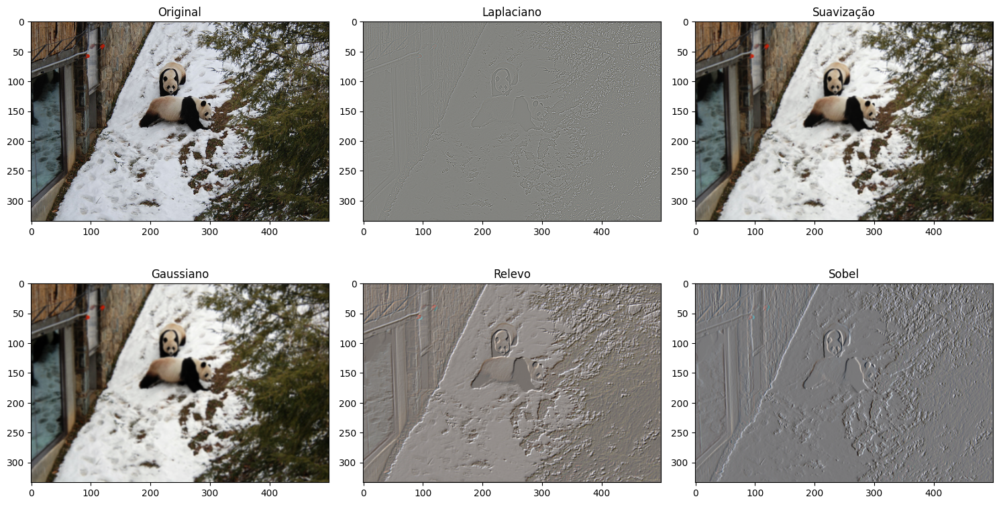

In [2]:
# Função para aplicar um filtro à imagem
def ignore(imagem, filtro):
    # Obtém as dimensões do filtro
    l_filtro, c_filtro = filtro.shape
    # Calcula a metade das dimensões do filtro
    l = int(l_filtro/2)
    c = int(c_filtro/2)

    # Cria uma imagem vazia com o mesmo tamanho da imagem original
    img = np.zeros([imagem.shape[0], imagem.shape[1]])

    # Percorre a imagem original aplicando o filtro
    for i in range(l, imagem.shape[0]-l):
        for j in range(c, imagem.shape[1]-c):
            # Corta a imagem de acordo com o filtro
            corte = imagem[i-l:i+l+1, j-c:j+c+1]
            # Aplica o filtro ao corte e soma os valores
            img[i][j] = np.sum((corte*filtro))
    
    # Retorna a imagem filtrada
    return img


# Função para aplicar um filtro à imagem
def zero(imagem, filtro):
    # Calcula a metade das dimensões do filtro
    l = filtro.shape[0]//2
    c = filtro.shape[1]//2

    # Cria uma nova imagem com zeros e tamanho baseado no filtro e na imagem original
    new_img = np.zeros((filtro.shape[0]//2*2 + imagem.shape[0], filtro.shape[1]//2*2 + imagem.shape[1]))
    new_img[l:l+imagem.shape[0], c:c+imagem.shape[1]] = imagem.copy()
    
    # Cria uma imagem vazia com o mesmo tamanho da nova imagem
    img = np.zeros([new_img.shape[0], new_img.shape[1]])
    
    # Percorre a nova imagem aplicando o filtro
    for i in range(l, new_img.shape[0]-l):
        for j in range(c, new_img.shape[1]-c):
            # Corta a imagem de acordo com o filtro
            corte = new_img[i-l:i+l+1, j-c:j+c+1]
            # Aplica o filtro ao corte e soma os valores
            img[i][j] = np.sum((corte*filtro))
            
    # Retorna a imagem filtrada cortando as bordas adicionadas
    return img[l:l+imagem.shape[0], c:c+imagem.shape[1]]


# Função para aplicar um filtro à imagem com borda espelhada
def espelho(imagem, filtro):
    # Calcula a metade das dimensões do filtro
    l = filtro.shape[0]//2
    c = filtro.shape[1]//2
    
    # Cria uma nova imagem com zeros e tamanho baseado no filtro e na imagem original
    new_img = np.zeros((filtro.shape[0]//2*2 + imagem.shape[0], filtro.shape[1]//2*2 + imagem.shape[1]))
    # Copia a imagem original para o centro da nova imagem
    new_img[l:l+imagem.shape[0], c:c+imagem.shape[1]] = imagem.copy()
    
    # Define os limites para espelhamento
    l1, c1 = l*2-1, c*2-1
    l2, c2 = l+imagem.shape[0]-1, c+imagem.shape[1]-1
    l3, c3 = l*2-1, c*2
    l4, c4 = l+imagem.shape[0]-1, c
    l7 = l*2-1
    l8 = l+imagem.shape[0]-1
    
    # Percorre pelos pixels da nova imagem
    for i in range(new_img.shape[0]):
        c5 = c*2-1
        c6 = c+imagem.shape[1]-1
        for j in range(new_img.shape[1]):
            # Verifica as condições para espelhamento e atribui os valores correspondentes
            
            # Diagonal superior esquerda
            if(i == j) and (i < l):
                new_img[i][j] = new_img[l1][c1]
                l1 -= 1
                c1 -= 1
                
            # Diagonal inferior direita
            elif(i == j) and (i >= l+imagem.shape[0]):
                new_img[i][j] = new_img[l2][c2]
                l2 -= 1
                c2 -= 1
                
            # Diagonal superior direita
            elif(i + j == new_img.shape[1]-1) and (j >= c+imagem.shape[1]):
                new_img[i][j] = new_img[l3][c3]
                l3 += 1
                c3 += 1
                
            # Diagonal inferior esquerda
            elif(i + j == new_img.shape[1]-1) and (j < c):
                new_img[i][j] = new_img[l4][c4]
                l4 -= 1
                c4 += 1
            
            # Esquerda
            elif(i >= l) and (i < l+imagem.shape[0]) and (j < c):
                new_img[i][j] = new_img[i][c5]
                c5 -= 1
                
            # Direita
            elif(i >= l) and (i < l+imagem.shape[0]) and (j >= c+imagem.shape[1]):
                new_img[i][j] = new_img[i][c6]
                c6 -= 1
                
            # Superior
            elif(j >= c) and (j < c+imagem.shape[1]) and (i < l):
                new_img[i][j] = new_img[l7][j]
                
            # Inferior
            elif(j >= c) and (j < c+imagem.shape[1]) and (i >= l+imagem.shape[0]):
                new_img[i][j] = new_img[l8][j]
            
            # Sobras
            elif(i < l) and (j < c):
                new_img[i][j] = new_img[l][c]
            elif(i < l) and (j >= c+imagem.shape[1]):
                new_img[i][j] = new_img[l][c+imagem.shape[1]-1]
            elif(i >= l+imagem.shape[0]) and (j < c):
                new_img[i][j] = new_img[l+imagem.shape[0]-1][c]
            elif(i >= l+imagem.shape[0]) and (j >= c+imagem.shape[1]):
                new_img[i][j] = new_img[l+imagem.shape[0]-1][c+imagem.shape[1]-1]
            
        l7 -= 1
        
        if(i > l+imagem.shape[0]-1):
            l8 -= 1

    # Cria uma matriz de zeros com as mesmas dimensões da nova imagem
    img = np.zeros([new_img.shape[0], new_img.shape[1]])
    
    # Percorre pelos pixels da nova imagem
    for i in range(l, new_img.shape[0]-l):
        for j in range(c, new_img.shape[1]-c):
            # Extrai a região da nova imagem correspondente ao tamanho do filtro
            corte = new_img[i-l:i+l+1, j-c:j+c+1]
            # Realiza a operação de convolução e atribui o resultado à posição correspondente na nova imagem
            img[i][j] = np.sum((corte*filtro))
            
    # Retorna a imagem filtrada cortando as bordas adicionadas
    return img[l:l+imagem.shape[0], c:c+imagem.shape[1]]



# Função para aplicar um filtro à imagem com borda replicada
def replicar(imagem, filtro):
    # Calcula a metade das dimensões do filtro
    l = filtro.shape[0]//2
    c = filtro.shape[1]//2
    
    # Cria uma nova imagem com zeros e tamanho baseado no filtro e na imagem original
    new_img = np.zeros((filtro.shape[0]//2*2 + imagem.shape[0], filtro.shape[1]//2*2 + imagem.shape[1]))
    # Copia a imagem original para o centro da nova imagem
    new_img[l:l+imagem.shape[0], c:c+imagem.shape[1]] = imagem.copy()
    
    # Percorre pelos pixels da nova imagem
    for i in range(new_img.shape[0]):
        for j in range(new_img.shape[1]):
            # Verifica as condições para replicação e atribui os valores correspondentes
            
            # Superior
            if (j >= c) and (j <= imagem.shape[1]) and (i < l):
                new_img[i][j] = new_img[l][j]
                
            # Esquerda
            elif (i >= l) and (i <= imagem.shape[0]) and (j < c):
                new_img[i][j] = new_img[i][c]
                
            # Inferior
            elif (j >= c) and (j <= imagem.shape[1]) and (i > imagem.shape[0]):
                new_img[i][j] = new_img[imagem.shape[0]][j]
        
            # Direita
            elif (i >= l) and (i <= imagem.shape[0]) and (j > imagem.shape[1]):
                new_img[i][j] = new_img[i][imagem.shape[1]]
                
            # Diagonal superior esquerdo
            elif (i < l) and (j < c):
                new_img[i][j] = new_img[l][c]
                
            # Diagonal superior direito
            elif (i < l) and (j > imagem.shape[1]):
                new_img[i][j] = new_img[l][imagem.shape[1]]
            
            # Diagonal inferior esquerdo
            elif (i > imagem.shape[0]) and (j < c):
                new_img[i][j] = new_img[imagem.shape[0]][c]
                
            # Diagonal inferior direito
            elif (i > imagem.shape[0]) and (j > imagem.shape[1]):
                new_img[i][j] = new_img[imagem.shape[0]][imagem.shape[1]]

    # Cria uma matriz de zeros com as mesmas dimensões da nova imagem
    img = np.zeros([new_img.shape[0], new_img.shape[1]])
    
    # Percorre pelos pixels da nova imagem
    for i in range(l, new_img.shape[0]-l):
        for j in range(c, new_img.shape[1]-c):
            # Extrai a região da nova imagem correspondente ao tamanho do filtro
            corte = new_img[i-l:i+l+1, j-c:j+c+1]
            # Realiza a operação de convolução e atribui o resultado à posição correspondente na nova imagem
            img[i][j] = np.sum((corte*filtro))
            
    # Retorna a imagem filtrada cortando as bordas adicionadas
    return img[l:l+imagem.shape[0], c:c+imagem.shape[1]]


def normalizar(img):
    img_max = img.max()
    img_min = img.min()

    # Loop pelos pixels da imagem para normalização
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            # Normaliza o valor do pixel e atribui à imagem
            n = (img[i][j] - img_min)/(img_max - img_min )
            img[i][j] = n*255
            
    return img

def convolucao(imagem, filtro, borda='ignore'):
    
    if(borda == 'ignore'):
        if(len(imagem.shape) == 3):
            red = imagem[:, :, 0]
            green = imagem[:, :, 1]
            blue = imagem[:, :, 2]
            
            resultR = ignore(red, filtro)
            resultG = ignore(green, filtro)
            resultB = ignore(blue, filtro)
            
            rgbArray = np.zeros((imagem.shape[0],imagem.shape[1],3),'uint8')
            rgbArray[:,:, 0] = normalizar(resultR)
            rgbArray[:,:, 1] = normalizar(resultG)
            rgbArray[:,:, 2] = normalizar(resultB)

            imagem_processada = rgbArray#np.dstack([resultR, resultG, resultB]).reshape(imagem.shape)
        else:
            filterImg1 = ignore(imagem, filtro)
            imagem_processada = normalizar(filterImg1)
    
    elif(borda == 'zero'):
        if(len(imagem.shape) == 3):
            red = imagem[:, :, 0]
            green = imagem[:, :, 1]
            blue = imagem[:, :, 2]
            
            resultR = zero(red, filtro)
            resultG = zero(green, filtro)
            resultB = zero(blue, filtro)

            rgbArray = np.zeros((imagem.shape[0],imagem.shape[1],3),'uint8')
            rgbArray[:,:, 0] = normalizar(resultR)
            rgbArray[:,:, 1] = normalizar(resultG)
            rgbArray[:,:, 2] = normalizar(resultB)

            imagem_processada = rgbArray
        else:
            filterImg2 = zero(imagem, filtro)
            imagem_processada = normalizar(filterImg2)
            
    elif(borda == 'replicar'):
        if(len(imagem.shape) == 3):
            red = imagem[:, :, 0]
            green = imagem[:, :, 1]
            blue = imagem[:, :, 2]
            
            resultR = replicar(red, filtro)
            resultG = replicar(green, filtro)
            resultB = replicar(blue, filtro)
            
            print(resultR.shape, resultG.shape, resultB.shape)

            rgbArray = np.zeros((imagem.shape[0],imagem.shape[1],3),'uint8')
            rgbArray[:,:, 0] = normalizar(resultR)
            rgbArray[:,:, 1] = normalizar(resultG)
            rgbArray[:,:, 2] = normalizar(resultB)

            imagem_processada = rgbArray
        else:
            filterImg3 = replicar(imagem, filtro)
            imagem_processada = normalizar(filterImg3)
            
    elif(borda == 'espelho'):
        if(len(imagem.shape) == 3):
            red = imagem[:, :, 0]
            green = imagem[:, :, 1]
            blue = imagem[:, :, 2]
            
            resultR = espelho(red, filtro)
            resultG = espelho(green, filtro)
            resultB = espelho(blue, filtro)

            rgbArray = np.zeros((imagem.shape[0],imagem.shape[1],3),'uint8')
            rgbArray[:,:, 0] = normalizar(resultR)
            rgbArray[:,:, 1] = normalizar(resultG)
            rgbArray[:,:, 2] = normalizar(resultB)

            imagem_processada = rgbArray#np.dstack([resultR, resultG, resultB]).reshape(imagem.shape)
        else:
            filterImg4 = espelho(imagem, filtro)
            imagem_processada = normalizar(filterImg4)
    
    return imagem_processada
    
def main1():
    img = imread('panda.jpg')
    copia = img.copy()

    #Filtros:
    laplaciano = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
    suavizacao = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])
    gaussiano = np.array([[1, 4, 7, 4, 1], [4, 16, 26, 16, 4], [7, 26, 41, 26, 7], [4, 16, 26, 16, 4], [1, 4, 7, 4, 1]])
    relevo = np.array([[-2, -1, 0], [-1, 1, 1], [0, 1, 2]])
    sobel = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    
#     img = rgb2gray(img)*255
#     copia = rgb2gray(copia)*255
    
    result1 = convolucao(img, laplaciano, 'ignore')
    result2 = convolucao(img, suavizacao, 'ignore')
    result3 = convolucao(img, gaussiano, 'espelho')
    result4 = convolucao(img, relevo, 'ignore')
    result5 = convolucao(img, sobel, 'ignore')
    
    # Criar subplots com 2 linhas e 3 colunas
    fig, axs = plt.subplots(2, 3, figsize=(15, 8))

    # Títulos
    titles = ['Original', 'Laplaciano', 'Suavização', 'Gaussiano', 'Relevo', 'Sobel']

    # Adicionar imagens aos subplots
    axs[0, 0].imshow(img)
    axs[0, 0].set_title(titles[0])

    axs[0, 1].imshow(result1)
    axs[0, 1].set_title(titles[1])

    axs[0, 2].imshow(result2)
    axs[0, 2].set_title(titles[2])

    axs[1, 0].imshow(result3)
    axs[1, 0].set_title(titles[3])

    axs[1, 1].imshow(result4)
    axs[1, 1].set_title(titles[4])

    axs[1, 2].imshow(result5)
    axs[1, 2].set_title(titles[5])

    # Ajustar layout para evitar sobreposição de títulos
    plt.tight_layout()
    plt.show()
main1()

 ## Questão 02
Crie uma função para aplicar filtros não-lineares, os filtros possíveis deverão ser o seguinte:
 
    a. Mediana 

    b. Moda 

    c. Máximo 

    d. Mínimo


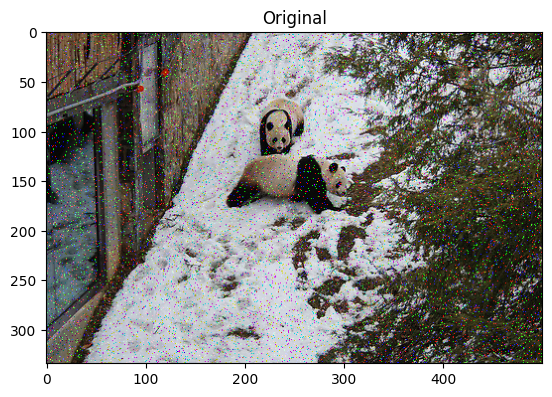

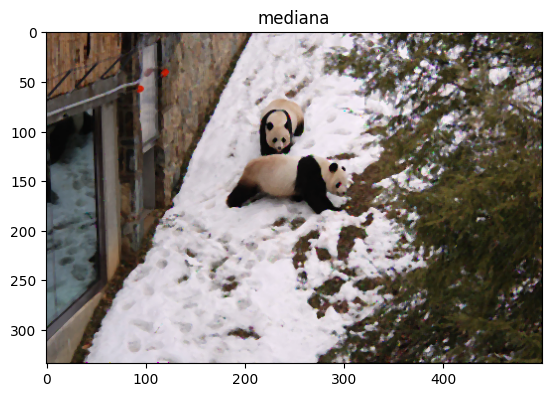

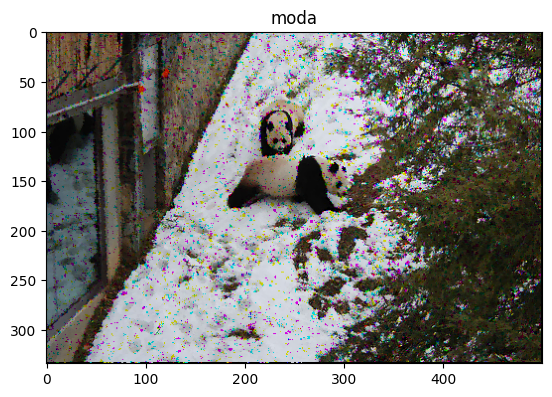

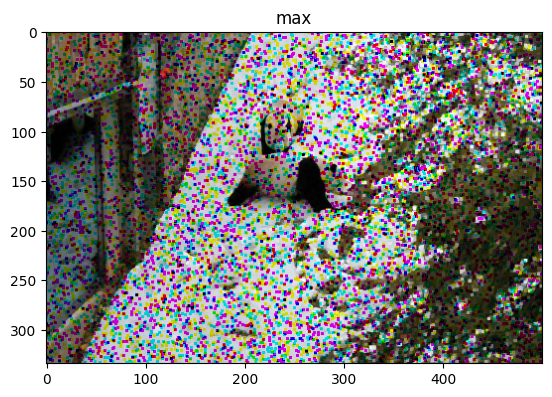

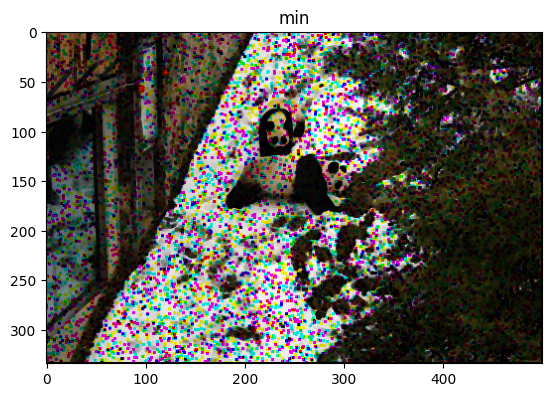

In [3]:
from skimage.io import imread,imsave, imshow
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import random
import math
import numpy as np
from collections import Counter
from skimage.util import random_noise

# Função para aplicar um filtro à imagem
def aplicaFiltro(imagem, filtroLinhas, filtroColunas, filtro):
    
    # Calcula a metade das linhas e colunas do filtro
    l = int(filtroLinhas/2)
    c = int(filtroColunas/2)
    
    # Cria uma nova imagem com zeros e tamanho baseado no filtro e na imagem original
    new_img = np.zeros((filtroLinhas//2*2 + imagem.shape[0], filtroColunas//2*2 + imagem.shape[1]))
    # Copia a imagem original para o centro da nova imagem
    new_img[filtroLinhas//2:imagem.shape[0]+1, filtroColunas//2:imagem.shape[1]+1] = imagem.copy()
    
    # Cria uma imagem vazia com o mesmo tamanho da nova imagem
    img = np.zeros([new_img.shape[0], new_img.shape[1]])
    
    # Percorre a nova imagem aplicando o filtro
    for i in range(l, new_img.shape[0]-l):
        for j in range(c, new_img.shape[1]-c):
            
            # Corta a imagem de acordo com o filtro
            corte = new_img[i-l:i+l+1, j-c:j+c+1]
            # Transforma o corte em um array unidimensional
            kernel = np.asarray(corte).reshape(-1)
            
            # Aplica o filtro correspondente
            if(filtro == 'mediana'):
                img[i][j] = np.median(corte)
                    
            elif(filtro == 'moda'):
                data = Counter(kernel) 
                get_mode = dict(data) 
                mode = [k for k, v in get_mode.items() if v == max(list(data.values()))]
                img[i][j] = mode[0]
                
            elif(filtro == 'max'):
                img[i][j] = kernel.max()
                
            elif(filtro == 'min'):
                img[i][j] = kernel.min()
                
            elif(filtro == 'media'):
                img[i][j] = kernel.mean()
            
    # Retorna a imagem filtrada
    return img[filtroLinhas//2:imagem.shape[0]+1, filtroColunas//2:imagem.shape[1]+1]

# Função para normalizar a imagem
def normalizar(img):
    # Encontra o valor máximo e mínimo da imagem
    img_max = img.max()
    img_min = img.min()
    
    # Percorre a imagem normalizando cada pixel
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            n = (img[i][j] - img_min)/(img_max - img_min )
            img[i][j] = n*256
            
    # Retorna a imagem normalizada
    return img

# Função para aplicar filtros não lineares
def filtrosNaoLineares(imagem, filtroLinhas, filtroColunas, tipo):
    # Verifica se a imagem é colorida
    if(len(imagem.shape) == 3):
        # Separa os canais de cor
        red = imagem[:, :, 0]
        green = imagem[:, :, 1]
        blue = imagem[:, :, 2]

        # Aplica o filtro em cada canal de cor
        resultR = aplicaFiltro(red, filtroLinhas, filtroColunas, tipo)
        resultG = aplicaFiltro(green, filtroLinhas, filtroColunas, tipo)
        resultB = aplicaFiltro(blue, filtroLinhas, filtroColunas, tipo)

        # Cria uma nova imagem colorida com os canais filtrados
        rgbArray = np.zeros((imagem.shape[0],imagem.shape[1],3),'uint8')
        rgbArray[:,:, 0] = normalizar(resultR)
        rgbArray[:,:, 1] = normalizar(resultG)
        rgbArray[:,:, 2] = normalizar(resultB)

        # Define a imagem processada
        imagem_processada = rgbArray
    else:
        # Aplica o filtro na imagem em escala de cinza
        filterNotLinear = aplicaFiltro(imagem, filtroLinhas, filtroColunas, tipo)
        # Define a imagem processada
        imagem_processada = normalizar(filterNotLinear)

    # Retorna a imagem processada
    return imagem_processada

def main2():
    img = imread('panda.jpg')
    copia = img.copy()

#     img = rgb2gray(img)
#     copia = rgb2gray(copia)*255
    
    img = random_noise(img, 's&p')
    filtro = ['mediana', 'moda', 'max', 'min']
    
    plt.figure()
    plt.title('Original')
    plt.imshow(img)
    
    for i in range(4):
        result = filtrosNaoLineares(img, 3, 3, filtro[i])
        plt.figure()
        plt.title(filtro[i])
        plt.imshow(result)

main2()

## Questão 03 
Utilizando o algoritmo da questão 1, aplique o filtro Laplaciano em uma imagem em tons de
cinza. Utilize o filtro para realçar a imagem utilizada. O que aconteceu com a imagem após
a aplicação do realce?


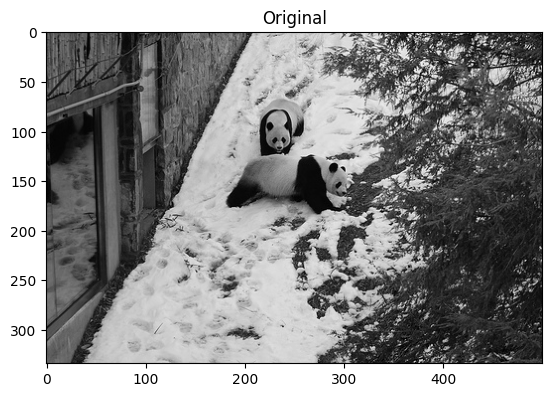

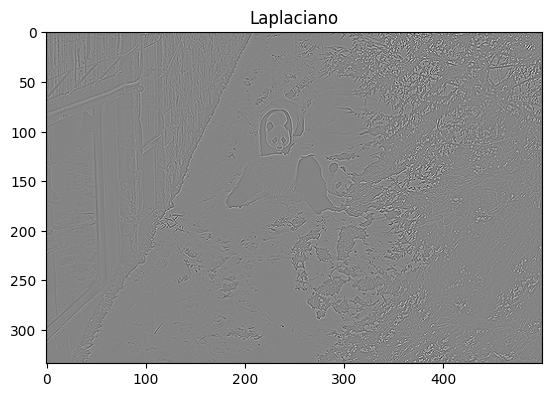

In [13]:
img = imread('panda.jpg')
copia = img.copy()
filtro = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])

img = rgb2gray(img)*255
copia = rgb2gray(copia)*255

result = convolucao(img, filtro, 'ignore')

plt.figure()
plt.title('Original')
plt.imshow(copia, cmap='gray')
plt.figure()
plt.title('Laplaciano')
plt.imshow(result, cmap='gray')

### Explicação:
O que aconteceu com a imagem após
a aplicação do realce?
    
    Quando aplicado o filtro Laplaciano à uma imagem em tons de cinza, você está realçando as características da imagem que têm uma alta variação de intensidade, como os contornos dos pandas, as folhas das árvores e os flocos de neve. Isso torna a imagem mais nítida e detalhada, mas também pode introduzir algum ruído ou artefatos na imagem.

## Questão 04 
Implemente uma máscara de nitidez e uma filtragem high-boost utilizando o algoritmo da
questão 1. Explique os passos de ambas implementações e diferencie o resultado das
mesmas. Utilize pelo menos 3 valores de k no intervalor 0 < k < 2.


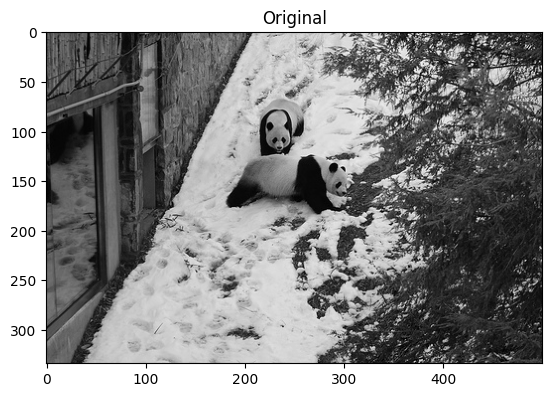

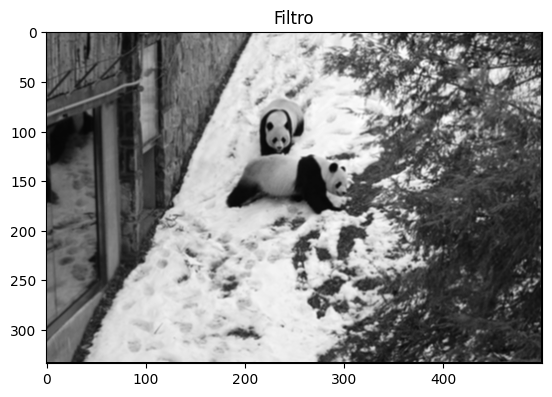

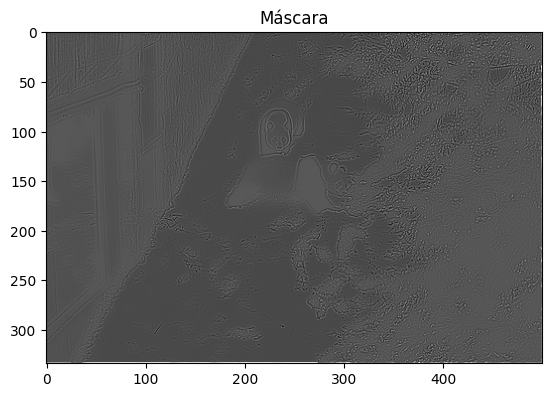

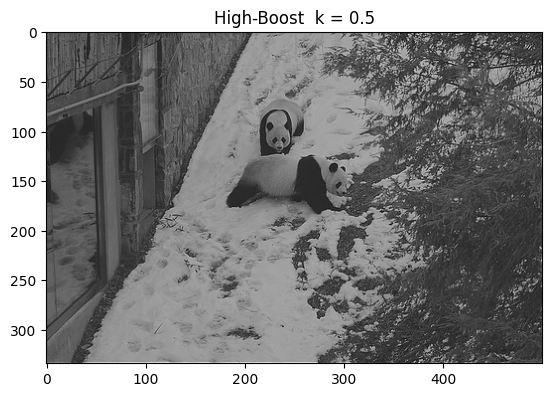

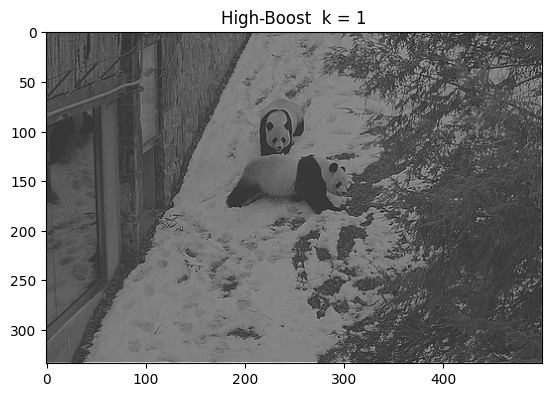

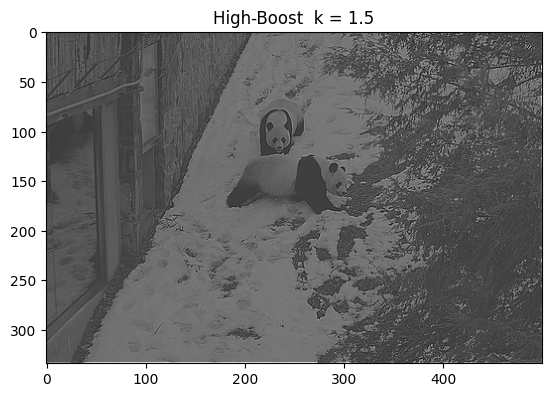

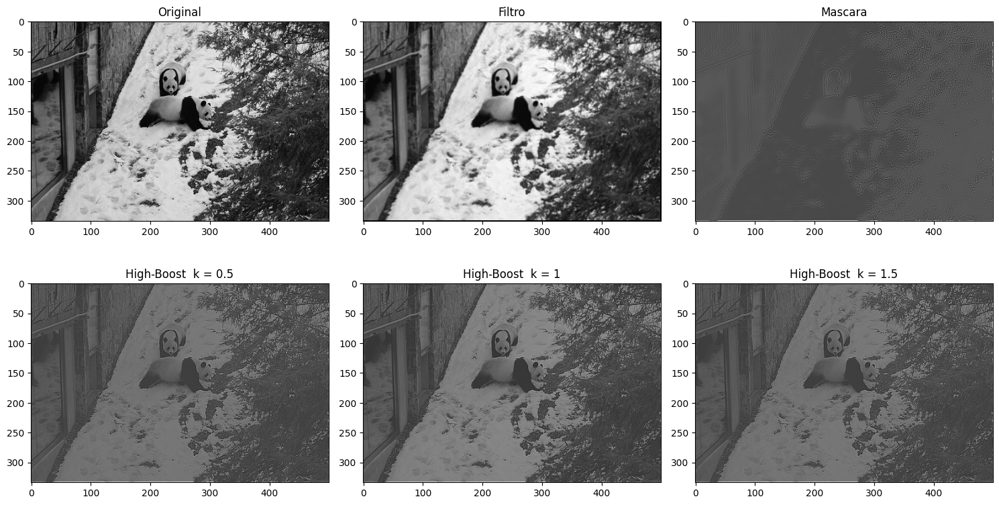

In [38]:
img = imread('panda.jpg')
copia = img.copy()
filtro = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])

img = rgb2gray(img)*255
copia = rgb2gray(copia)*255

result = convolucao(img, filtro, 'ignore')
mascara = copia - result
high_boost = img + 0.5 * mascara

plt.figure()
plt.title('Original')
plt.imshow(copia, cmap='gray')
plt.figure()
plt.title('Filtro')
plt.imshow(result, cmap='gray')
plt.figure()
plt.title('Máscara')
plt.imshow(mascara, cmap='gray')

plt.figure()
plt.title('High-Boost  k = 0.5')
plt.imshow(high_boost, cmap='gray')

high_boost = img + 1 * mascara
plt.figure()
plt.title('High-Boost  k = 1')
plt.imshow(high_boost, cmap='gray')

high_boost = img + 1.5 * mascara
plt.figure()
plt.title('High-Boost  k = 1.5')
plt.imshow(high_boost, cmap='gray')

# Criar subplots com 2 linhas e 3 colunas
fig, axs = plt.subplots(2, 3, figsize=(15, 8))

# Títulos
titles = ['Original', 'Filtro', 'Mascara', 'High-Boost  k = 0.5', 'High-Boost  k = 1', 'High-Boost  k = 1.5']

# Adicionar imagens aos subplots
axs[0, 0].imshow(img, cmap='gray')
axs[0, 0].set_title(titles[0])

axs[0, 1].imshow(result, cmap='gray')
axs[0, 1].set_title(titles[1])

axs[0, 2].imshow(mascara, cmap='gray')
axs[0, 2].set_title(titles[2])

axs[1, 0].imshow(high_boost, cmap='gray')
axs[1, 0].set_title(titles[3])

high_boost = img + 1 * mascara
axs[1, 1].imshow(high_boost, cmap='gray')
axs[1, 1].set_title(titles[4])


high_boost = img + 1.5 * mascara
axs[1, 2].imshow(high_boost, cmap='gray')
axs[1, 2].set_title(titles[5])

# Ajustar layout para evitar sobreposição de títulos
plt.tight_layout()
plt.show()

### Explicação:
A implementação de uma máscara de nitidez e uma filtragem high-boost resulta em imagens com diferentes níveis de nitidez e contraste. O parâmetro k na filtragem high-boost controla o quanto o filtro de nitidez é aplicado à imagem. k=0.5: 
    
    k=0.5: Resulta em uma imagem com menos contraste. A imagem parece mais suave e os detalhes não são tão pronunciados.

    k=1: Resulta em uma imagem com contraste moderado. Os detalhes são mais visíveis em comparação com a imagem com k=0.5.

    k=1.5: Resulta em uma imagem com alto contraste. Os detalhes são muito pronunciados e a imagem parece mais nítida em comparação com as imagens com k=0.5 e k=1.

## Questão 05
Aplique os filtros da média e mediana em uma imagem ruidosa, o que aconteceu? Qual tipo
de ruído existia na imagem

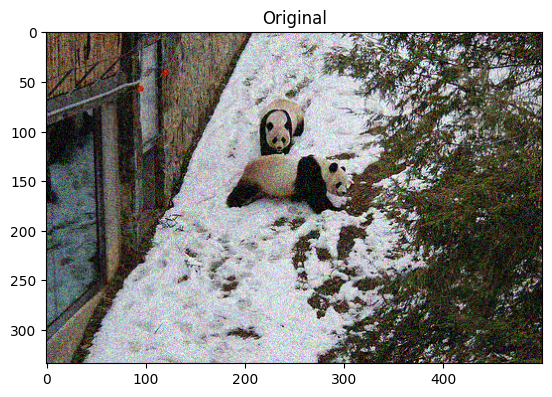

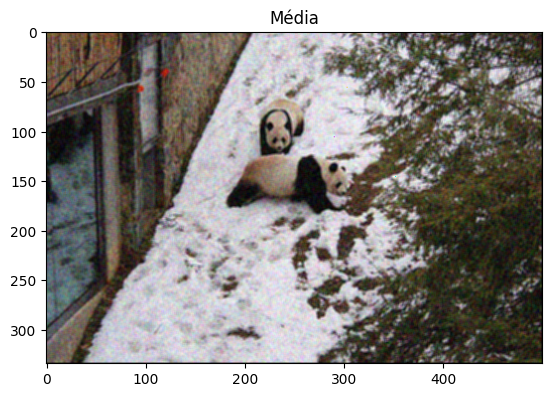

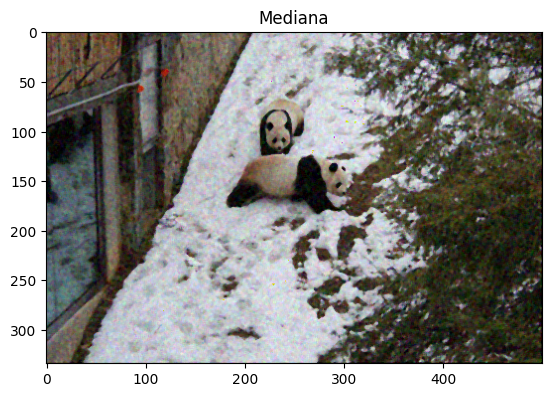

In [6]:
img = imread('panda.jpg')

#img = rgb2gray(img)
img = random_noise(img)

copia = img.copy()

media = filtrosNaoLineares(img, 3, 3, 'media')
mediana = filtrosNaoLineares(img, 3, 3, 'mediana')

plt.figure()
plt.title('Original')
plt.imshow(copia, cmap='gray')
plt.figure()
plt.title('Média')
plt.imshow(media, cmap='gray')
plt.figure()
plt.title('Mediana')
plt.imshow(mediana, cmap='gray')

### Explicação:
O que aconteceu?
	
	Na aplicação do filtro da media, nota-se uma suavização e redução de ruido, e na mediana é bem semelhante, diferenciam em um detalhe de remoção de outliers, ou seja remoção de pixeis de valores extremos que podem ser causados por ruído.
	
Qual tipo de ruído existia na imagem?
	
	O tipo de ruído não é especificado no código fornecido, mas pela função random_noise, podemos assumir que é adicionado um ruído aleatório à imagem. Esse tipo de ruído pode incluir variações aleatórias na intensidade dos pixels, resultando em pontos brancos ou pretos espalhados pela imagem.